## 1.Libraries

In [1]:
import pandas as pd
import numpy as np
from numpy import mean, std
import seaborn as sns 
import matplotlib.pyplot as plt
from matplotlib import pyplot
from matplotlib.gridspec import GridSpec

from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor
from catboost import Pool, CatBoostRegressor, cv
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import StackingRegressor


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

execfile('viz.py')

## 2. Reading the Data

In [2]:
data = pd.read_csv('Data.csv')
data.head(5)

,user ID,DateFormatted,RegistrationDeviceType,RegistrationAppExtension,MultipleDeprivationIndex,NetAnnualIncome,Region,Marketing Channel,0_total_stakes,1_total_stakes,2_total_stakes,3_total_stakes,4_total_stakes,5_total_stakes,6_total_stakes,0_count_stakes,1_count_stakes,2_count_stakes,3_count_stakes,4_count_stakes,5_count_stakes,6_count_stakes,0_device,1_device,2_device,3_device,4_device,5_device,6_device,0_category,1_category,2_category,3_category,4_category,5_category,6_category,0_status,1_status,2_status,3_status,4_status,5_status,6_status,0_bonus_stakes,1_bonus_stakes,2_bonus_stakes,3_bonus_stakes,4_bonus_stakes,5_bonus_stakes,6_bonus_stakes,0_cash_hold,1_cash_hold,2_cash_hold,3_cash_hold,4_cash_hold,5_cash_hold,6_cash_hold,0_net_gaming_revenue_y,1_net_gaming_revenue_y,2_net_gaming_revenue_y,3_net_gaming_revenue_y,4_net_gaming_revenue_y,5_net_gaming_revenue_y,6_net_gaming_revenue_y,0_total_freebets,1_total_freebets,2_total_freebets,3_total_freebets,4_total_freebets,5_total_freebets,6_total_freebets,0_count_deposits,1_count_deposits,2_count_deposits,3_count_deposits,4_count_deposits,5_count_deposits,6_count_deposits,0_total_deposits,1_total_deposits,2_total_deposits,3_total_deposits,4_total_deposits,5_total_deposits,6_total_deposits,0_count_withdrawals,1_count_withdrawals,2_count_withdrawals,3_count_withdrawals,4_count_withdrawals,5_count_withdrawals,6_count_withdrawals,0_total_withdrawals,1_total_withdrawals,2_total_withdrawals,3_total_withdrawals,4_total_withdrawals,5_total_withdrawals,6_total_withdrawals,LTV
0,570218,19/09/2018,Desktop,Not Available,6299,33100,South East,SEO,192.1,0.00,324.0,150.0,0.0,0.0,0.0,194,0,307,137,0,0,0,Desktop,NaN,Desktop,Desktop,NaN,NaN,NaN,Slots,NaN,Slots,Slots,NaN,NaN,NaN,Active,NaN,Suspended,Suspended,NaN,NaN,NaN,0.0,0.00,0.0,0.96,0.00,0.0,0.0,79.91,0.00,60.05,79.69,0.00,0.00,0.0,79.91,0.00,60.05,79.65,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4,0,3,4,0,0,0,80.0,0.0,60.0,80.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34.30330
1,181927,28/06/2017,Mobile,Not Available,25574,51700,South East,Club,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-20.00000
2,798130,24/04/2019,Mobile,Not Available,1957,0,NaN,Club,0.0,181.87,5.5,0.0,0.0,0.0,0.0,0,208,9,0,0,0,0,NaN,Desktop,Desktop,NaN,NaN,NaN,NaN,NaN,Slots,ScratchCards,NaN,NaN,NaN,NaN,NaN,Active,Active,NaN,NaN,NaN,NaN,0.0,14.79,0.0,0.00,0.00,0.0,0.0,0.00,15.00,4.75,0.00,0.00,0.00,0.0,0.00,14.95,4.75,0.00,0.00,0.00,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0,3,1,0,0,0,0,0.0,15.0,5.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.42713
3,435124,25/03/2018,Mobile,Not Available,6585,0,NaN,SEO,870.6,2059.60,3662.2,4539.4,1848.6,5729.5,372.8,442,1062,1432,869,607,750,191,Mobile,Mobile,Mobile,Mobile,Mobile,Mobile,Mobile,Slots,Slots,Slots,Live Casino,Slots,Live Casino,Slots,Active,Active,NaN,Active,Active,Active,Active,0.0,0.00,0.0,0.00,40.94,0.0,0.0,240.00,554.82,0.00,424.94,229.78,234.99,100.0,240.00,554.82,0.00,424.94,229.72,229.99,100.0,0.0,0.0,0.0,0.0,10.0,5.0,0.0,5,14,10,11,8,7,3,240.0,555.0,380.0,425.0,230.0,230.0,100.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1482.78792
4,477235,28/05/2018,Desktop,Not Available,1962,0,NaN,SEO,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000


### 2.1 An Overview from the Data

In [3]:
print('Total Amount of Duplicates: ',data.duplicated().sum())

Total Amount of Duplicates:  0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 100 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   user ID                   10000 non-null  int64  
 1   DateFormatted             10000 non-null  object 
 2   RegistrationDeviceType    10000 non-null  object 
 3   RegistrationAppExtension  10000 non-null  object 
 4   MultipleDeprivationIndex  10000 non-null  int64  
 5   NetAnnualIncome           10000 non-null  int64  
 6   Region                    8749 non-null   object 
 7   Marketing Channel         10000 non-null  object 
 8   0_total_stakes            10000 non-null  float64
 9   1_total_stakes            10000 non-null  float64
 10  2_total_stakes            10000 non-null  float64
 11  3_total_stakes            10000 non-null  float64
 12  4_total_stakes            10000 non-null  float64
 13  5_total_stakes            10000 non-null  float64
 14  6_tota

In [5]:
total = data.isnull().sum().sort_values(ascending = False)
percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
missing_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
6_status,9510,95.10
6_device,9503,95.03
6_category,9503,95.03
5_status,9475,94.75
5_category,9463,94.63
5_device,9463,94.63
4_status,9410,94.10
4_category,9393,93.93
4_device,9393,93.93
3_status,9286,92.86


In [6]:
data.describe()

,user ID,MultipleDeprivationIndex,NetAnnualIncome,0_total_stakes,1_total_stakes,2_total_stakes,3_total_stakes,4_total_stakes,5_total_stakes,6_total_stakes,0_count_stakes,1_count_stakes,2_count_stakes,3_count_stakes,4_count_stakes,5_count_stakes,6_count_stakes,0_bonus_stakes,1_bonus_stakes,2_bonus_stakes,3_bonus_stakes,4_bonus_stakes,5_bonus_stakes,6_bonus_stakes,0_cash_hold,1_cash_hold,2_cash_hold,3_cash_hold,4_cash_hold,5_cash_hold,6_cash_hold,0_net_gaming_revenue_y,1_net_gaming_revenue_y,2_net_gaming_revenue_y,3_net_gaming_revenue_y,4_net_gaming_revenue_y,5_net_gaming_revenue_y,6_net_gaming_revenue_y,0_total_freebets,1_total_freebets,2_total_freebets,3_total_freebets,4_total_freebets,5_total_freebets,6_total_freebets,0_count_deposits,1_count_deposits,2_count_deposits,3_count_deposits,4_count_deposits,5_count_deposits,6_count_deposits,0_total_deposits,1_total_deposits,2_total_deposits,3_total_deposits,4_total_deposits,5_total_deposits,6_total_deposits,0_count_withdrawals,1_count_withdrawals,2_count_withdrawals,3_count_withdrawals,4_count_withdrawals,5_count_withdrawals,6_count_withdrawals,0_total_withdrawals,1_total_withdrawals,2_total_withdrawals,3_total_withdrawals,4_total_withdrawals,5_total_withdrawals,6_total_withdrawals,LTV
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,504195.874000,10550.243600,26623.760000,148.159269,82.243921,50.860913,32.467501,20.272672,26.070725,18.418748,61.150100,31.485200,19.236900,10.914600,9.187000,8.721600,6.693800,14.221163,4.859655,1.654800,1.487077,0.763056,0.451471,1.417987,2.366336,5.034465,1.850584,1.076405,0.252118,0.165073,1.250455,-2.207206,5.374488,1.925369,0.409144,0.176604,0.217002,1.178617,6.972271,0.919640,0.394733,0.274996,0.191923,0.138359,0.131262,0.609200,0.155900,0.108000,0.071400,0.057500,0.054400,0.048100,20.641154,6.600723,4.958516,2.484774,1.974448,2.928343,1.331133,0.034200,0.043600,0.016700,0.01650,0.007800,0.007800,0.005800,9.045075,6.954920,2.876429,4.129687,1.590948,1.484237,1.410572,74.921940
std,289255.015676,9312.935971,11977.507234,1329.443054,1444.319068,1509.889637,1228.469525,464.407399,835.419413,520.463980,250.591633,238.052921,210.878377,111.889111,103.810817,105.964457,88.748904,165.470779,89.428496,33.842831,50.111102,13.076127,7.939151,100.398051,472.793884,108.008892,120.565970,61.587562,58.274875,69.294148,66.174282,478.566071,110.052824,121.462766,86.119713,58.176562,69.554740,67.182057,18.127204,11.120188,3.984326,3.690084,3.326382,1.970182,3.079594,1.452889,0.967517,0.879894,0.613628,0.495397,0.517945,0.438869,162.218126,82.463772,98.653434,37.228967,28.667598,80.331147,21.274034,0.217336,0.242291,0.144302,0.21779,0.096644,0.130157,0.092559,476.504578,122.213852,104.431255,107.573788,45.866688,50.581145,42.488368,1107.362373
min,580.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-5.150000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-43173.300000,-2947.930000,-4915.000000,-3877.950000,-3794.980000,-5901.190000,-1021.100000,-431

In [7]:
data.describe(include='O') 

,DateFormatted,RegistrationDeviceType,RegistrationAppExtension,Region,Marketing Channel,0_device,1_device,2_device,3_device,4_device,5_device,6_device,0_category,1_category,2_category,3_category,4_category,5_category,6_category,0_status,1_status,2_status,3_status,4_status,5_status,6_status
count,10000,10000,10000,8749,10000,4538,1747,978,732,607,537,497,4538,1747,978,732,607,537,497,4517,1663,957,714,590,525,490
unique,1032,5,11,10,13,3,3,3,3,3,3,3,11,10,10,10,9,10,9,5,5,5,5,5,5,5
top,17/04/2019,Mobile,Not Available,North West,SEO,Mobile,Mobile,Mobile,Mobile,Mobile,Mobile,Mobile,Bingo,Bingo,Bingo,Bingo,Bingo,Bingo,Bingo,Active,Active,Active,Active,Active,Active,Active
freq,35,5222,9752,1434,2833,2936,1117,627,485,404,343,325,1795,697,385,312,252,223,214,4087,1498,857,629,550,491,463


## 3.EDA

So now we will go trough an exploratory data analysis to get insights from the first week data of Register users. The aim here is to divide this session into topics so we can explore graphics for each subject.
1. Transform timestamp columns
2. Extract time attributes from these datetime columns (year, month and day)
3. Evaluate the scenario using this attributes

In [8]:
data["DateFormatted"]=data["DateFormatted"].str.replace("/","-")
data["DateFormatted"] = pd.to_datetime(data["DateFormatted"])

In [9]:
# Extracting attributes for Registration date - Year, Month and Day
data['registration_year'] = data["DateFormatted"].apply(lambda x: x.year)
data['registration_monthID'] = data["DateFormatted"].apply(lambda x: x.month)
data['registration_month'] = data["DateFormatted"].apply(lambda x: x.strftime('%b'))
data['registration_year_month'] = data["DateFormatted"].apply(lambda x: x.strftime('%Y%m'))
data['registration_day'] = data["DateFormatted"].apply(lambda x: x.strftime('%a'))
data["DateFormatted"] = data["DateFormatted"].apply(lambda x: x.strftime('%Y%m%d'))

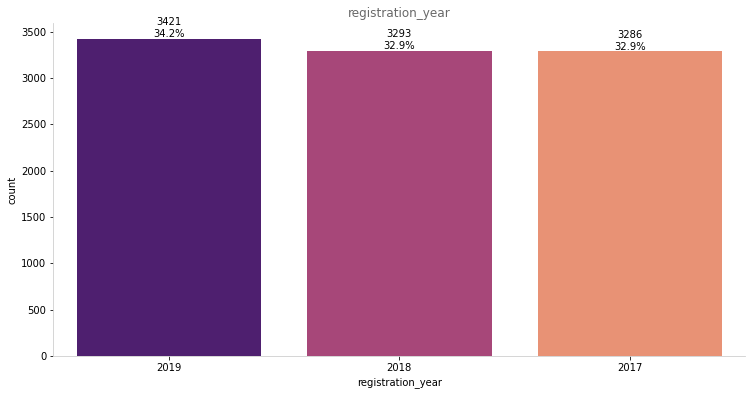

In [10]:
# plotting a chart for Registration year
fig = plt.figure(constrained_layout=True, figsize=(20, 10))
gs = GridSpec(2, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])

single_countplot(data, x='registration_year', ax=ax1,  palette='magma')
ax1.set_title('registration_year', size=12, color='dimgrey')

plt.show()

by the chart above displaying the distribution of registration carried out between 2017 to 2019, it can be said that registration of new customers has be quite constant over the years.

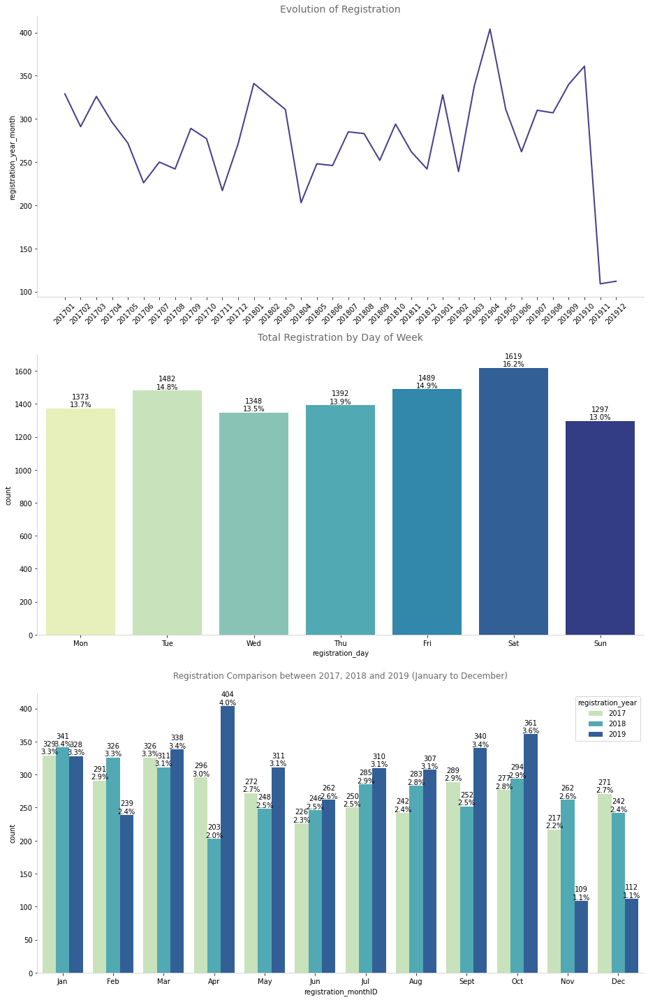

In [11]:
fig = plt.figure(figsize=(13, 20))

# Axis definition
gs = GridSpec(3, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, :])
ax3 = fig.add_subplot(gs[2, :])

# Lineplot - Evolution of Registration 
sns.lineplot(data=data['registration_year_month'].value_counts().sort_index(), ax=ax1, 
             color='darkslateblue', linewidth=2)
format_spines(ax1, right_border=False)  
for tick in ax1.get_xticklabels():
    tick.set_rotation(45)
ax1.set_title('Evolution of Registration', size=14, color='dimgrey')

# Barchart - Total Registration by Day of Week
single_countplot(data, x='registration_day', ax=ax2, order=False, palette='YlGnBu')
weekday_label = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
ax2.set_xticklabels(weekday_label)
ax2.set_title('Total Registration by Day of Week', size=14, color='dimgrey', pad=20)

# Bar chart - Registration Comparison between 2017, 2018 and 2019
df_orders_compare =data.query('registration_year in (2017, 2018, 2019) & registration_monthID <= 12')
single_countplot(df_orders_compare, x='registration_monthID', hue='registration_year', ax=ax3, order=False,
                 palette='YlGnBu')
month_label = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug','Sept','Oct','Nov','Dec']
ax3.set_xticklabels(month_label)
ax3.set_title('Registration Comparison between 2017, 2018 and 2019 (January to December)', size=12, color='dimgrey', pad=20)


plt.tight_layout()
plt.show()

From the charts above we can conclude:

1. Registration of new users has a ranging trend along the time. We can see some seasonality with peaks at specific months.
2. Saturdays experience the highest amount of registration closely followed by Friday and Tuesday, while Sunday experience the least amounts of registrations

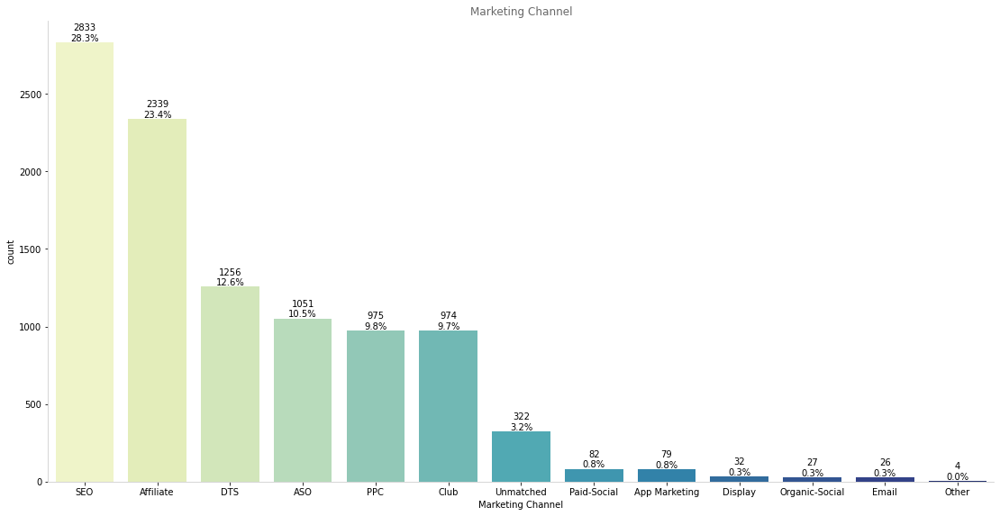

In [12]:
#chart Marketing Channel
fig = plt.figure(constrained_layout=True, figsize=(30, 15))
gs = GridSpec(2, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])

single_countplot(data, x='Marketing Channel', ax=ax1,  palette='YlGnBu')
ax1.set_title('Marketing Channel', size=12, color='dimgrey')

plt.show()

In [13]:
pd.crosstab(data['Marketing Channel'], data['registration_year'], dropna=False)

registration_year,2017,2018,2019
Marketing Channel,,,
ASO,357,401,293
Affiliate,763,756,820
App Marketing,20,41,18
Club,100,29,845
DTS,382,463,411
Display,7,17,8
Email,21,3,2
Organic-Social,13,7,7
Other,4,0,0


<AxesSubplot:xlabel='Marketing Channel'>

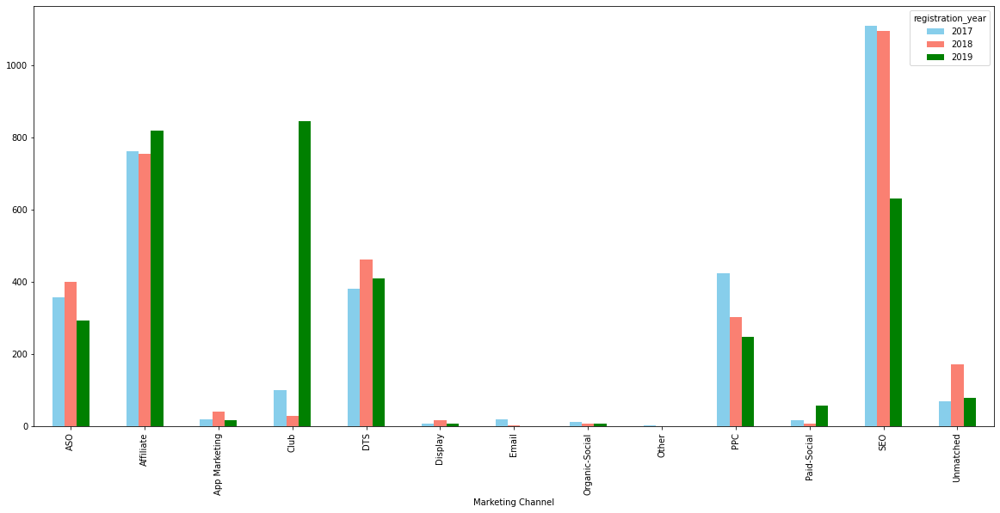

In [14]:
pd.crosstab(data['Marketing Channel'], data['registration_year'], dropna=False).plot(kind="bar", 
                                   figsize=(20,9), color=["skyblue","salmon","green"])

from the charts above we can see that
1. About 30% of all new registered come through the SEO channel with peak in 2017. It experience a 43% decrease in 2019.
2. Club experienced a 3000% increase in 2019 compared to 2018

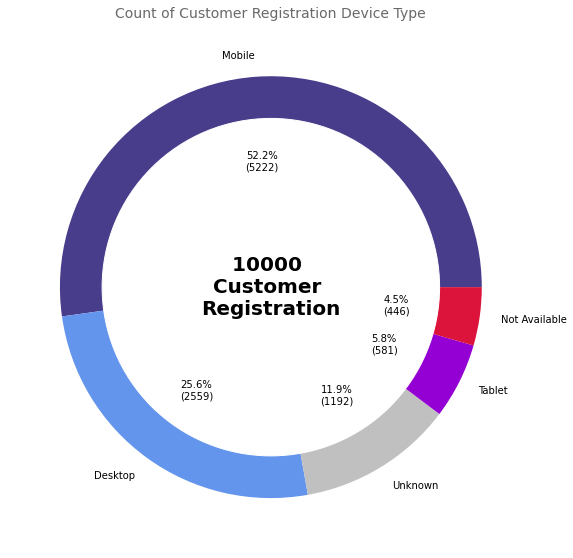

In [15]:
fig = plt.figure(constrained_layout=True, figsize=(20, 15))
gs = GridSpec(2, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])

colors = ['darkslateblue', 'cornflowerblue', 'silver', 'darkviolet', 'crimson']
label_names = data['RegistrationDeviceType'].value_counts().index
donut_plot(data, col='RegistrationDeviceType', ax=ax1, label_names=label_names, colors=colors,
           title='Count of Customer Registration Device Type', text=f'{len(data)} \nCustomer \nRegistration')
plt.show()

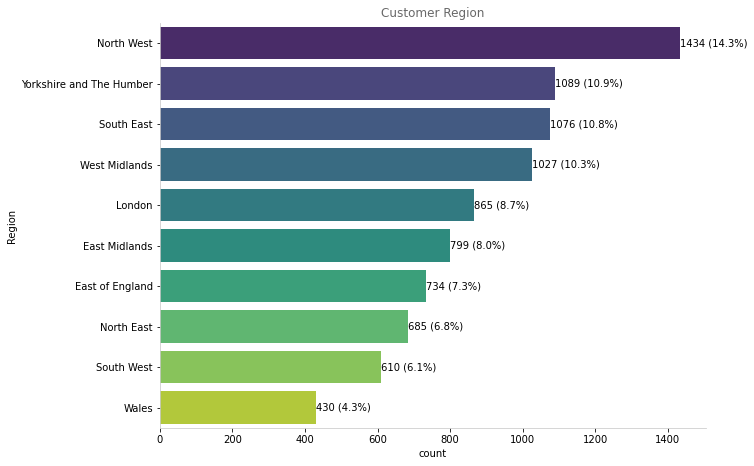

In [16]:
#chart of Customer Region 
fig = plt.figure(constrained_layout=True, figsize=(18, 12))
gs = GridSpec(2, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])

single_countplot(y='Region', ax=ax1, df=data, palette='viridis')
ax1.set_title('Customer Region', size=12, color='dimgrey')

plt.show()

<AxesSubplot:xlabel='Region'>

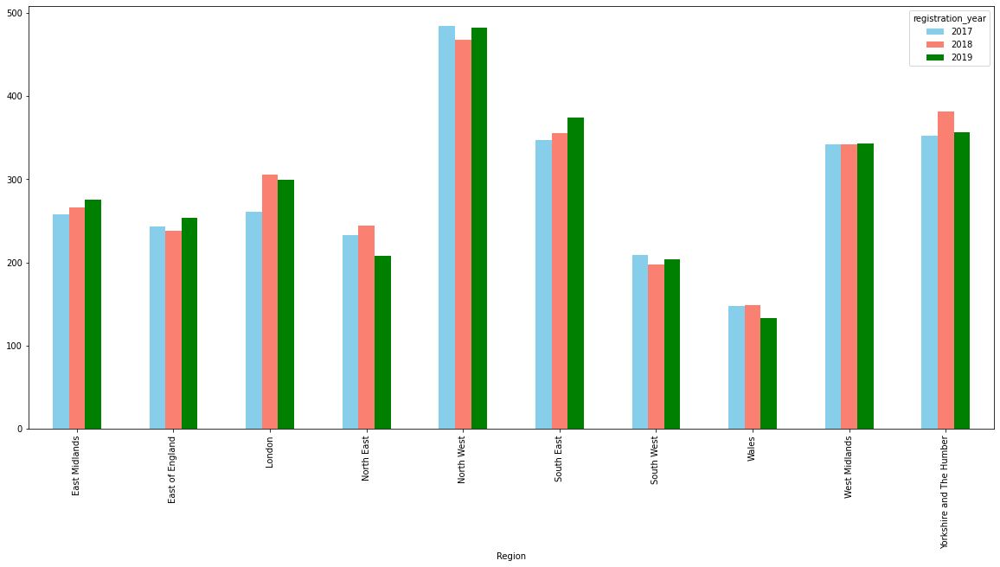

In [17]:
#Evolution of of Customer Registration by Region
pd.crosstab(data['Region'], data['registration_year'], dropna=False).plot(kind="bar", 
                                   figsize=(20,9), color=["skyblue","salmon","green"])

## 4. Data Preprocessing

From the first experiment i will the filling the blank spaces in the categorical feature with "Absent" under the assumption the each count column of every category represents a day worth of data. By replacing with absent it means no user data was record that day due to the client being inactive. 

In [18]:
#Dropping NaN by region 
df=data.copy()
df.dropna(subset=['Region'], inplace=True)
len(df)

8749

In [19]:
#replacing blank spaces with Absent
for index, value in df.dtypes.items(): 
    if value == 'object':
        df[index] = df[index].fillna('Absent')

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8749 entries, 0 to 9999
Columns: 105 entries, user ID to registration_day
dtypes: float64(50), int64(26), object(29)
memory usage: 7.1+ MB


## 5. Modelling

### RandomForest 

In [20]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
for index, value in df.dtypes.items(): 
    if value == 'object':
        df[index] = labelencoder.fit_transform(df[index])
df.head(10)

,user ID,DateFormatted,RegistrationDeviceType,RegistrationAppExtension,MultipleDeprivationIndex,NetAnnualIncome,Region,Marketing Channel,0_total_stakes,1_total_stakes,2_total_stakes,3_total_stakes,4_total_stakes,5_total_stakes,6_total_stakes,0_count_stakes,1_count_stakes,2_count_stakes,3_count_stakes,4_count_stakes,5_count_stakes,6_count_stakes,0_device,1_device,2_device,3_device,4_device,5_device,6_device,0_category,1_category,2_category,3_category,4_category,5_category,6_category,0_status,1_status,2_status,3_status,4_status,5_status,6_status,0_bonus_stakes,1_bonus_stakes,2_bonus_stakes,3_bonus_stakes,4_bonus_stakes,5_bonus_stakes,6_bonus_stakes,0_cash_hold,1_cash_hold,2_cash_hold,3_cash_hold,4_cash_hold,5_cash_hold,6_cash_hold,0_net_gaming_revenue_y,1_net_gaming_revenue_y,2_net_gaming_revenue_y,3_net_gaming_revenue_y,4_net_gaming_revenue_y,5_net_gaming_revenue_y,6_net_gaming_revenue_y,0_total_freebets,1_total_freebets,2_total_freebets,3_total_freebets,4_total_freebets,5_total_freebets,6_total_freebets,0_count_deposits,1_count_deposits,2_count_deposits,3_count_deposits,4_count_deposits,5_count_deposits,6_count_deposits,0_total_deposits,1_total_deposits,2_total_deposits,3_total_deposits,4_total_deposits,5_total_deposits,6_total_deposits,0_count_withdrawals,1_count_withdrawals,2_count_withdrawals,3_count_withdrawals,4_count_withdrawals,5_count_withdrawals,6_count_withdrawals,0_total_withdrawals,1_total_withdrawals,2_total_withdrawals,3_total_withdrawals,4_total_withdrawals,5_total_withdrawals,6_total_withdrawals,LTV,registration_year,registration_monthID,registration_month,registration_year_month,registration_day
0,570218,622,0,0,6299,33100,5,11,192.10,0.0,324.00,150.0,0.0,0.0,0.0,194,0,307,137,0,0,0,1,0,1,1,0,0,0,10,0,9,9,0,0,0,1,0,5,5,0,0,0,0.00,0.0,0.0,0.96,0.0,0.0,0.0,79.91,0.00,60.05,79.69,0.00,0.0,0.0,79.91,0.00,60.05,79.65,0.00,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4,0,3,4,0,0,0,80.0,0.0,60.0,80.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34.30330,2018,9,11,20,6
1,181927,178,1,0,25574,51700,5,3,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-20.00000,2017,6,6,5,6
84,211448,38,1,0,27,22200,7,1,0.00,30.9,0.00,0.0,0.0,0.0,0.0,0,144,0,0,0,0,0,0,2,0,0,0,0,0,0,9,0,0,0,0,0,0,5,0,0,0,0,0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,9.97,0.00,0.00,0.00,0.0,0.0,0.00,9.97,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.91490,2017,2,3,1,6
85,244805,280,0,0,1831,27100,7,1,1059.50,125.2,0.00,0.0,0.0,0.0,0.0,711,137,0,0,0,0,0,1,1,0,0,0,0,0,10,9,0,0,0,0,0,3,3,0,0,0,0,0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,137.42,40.06,0.00,0.00,0.00,0.0,0.0,137.42,40.06,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,2,0,0,0,0,0,137.5,40.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,441.26795,2017,10,10,9,1
86,363128,384,0,0,1820,29000,7,11,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,2018,1,4,12,1
87,518355,565,1,0,1674,32800,7,11,43.30,0.0,0.00,0.0,74.3,0.0,0.0,22,0,0,0,43,0,0,2,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,31.00,0.0,0.0,0.00,0.0,0.0,0.0,-44.25,0.00,0.00,0.00,-8.16,0.0,0.0,-44.25,0.00,0.00,0.00,-8.16,0.0,0.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.17516,2018,7,5,18,1
88,713498,768,0,0,246,23500,7,9,83.62,1.2,17.32,0.0,0.0,0.0,0.0,83,1,19,0,0,0,0,1,1,1,0,0,0,0,1,1,1,0,0,0,0,1,1,1,0,0,0,0,64.97,0.0,0.0,0.00,0.0,0.0,0.0,3.69,1.20,16.06,0.00,0.00,0.0,0.0,2.69,1.20,16.06,

In [21]:
X = df.drop(['LTV','user ID','DateFormatted','RegistrationAppExtension','registration_month'],axis=1)
y = df['LTV']
# Splitting dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42)

In [22]:
# RandomForest 
def rfr(X_train, X_test, y_train, y_test):    

    model = RandomForestRegressor()

    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
        
     # Metrics
    mae = np.mean(abs(predictions - y_test))
    rmse = mean_squared_error(y_test, predictions, squared=False)
    r2score = r2_score(y_test, predictions)
    
    print("MAE: ", mae)
    print("RMSE: ", rmse)
    print("R2: ",r2score)
        
    return model

In [23]:
randomforestmodel=rfr(X_train, X_test, y_train, y_test)

MAE:  97.48286933093715
RMSE:  570.5174615455994
R2:  0.08892394384438917


### KNeighborsRegressor

In [24]:
# KNeighborsRegressor
def KNr(X_train, X_test, y_train, y_test):    

    model = KNeighborsRegressor(5)

    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
        
     # Metrics
    mae = np.mean(abs(predictions - y_test))
    rmse = mean_squared_error(y_test, predictions, squared=False)
    r2score = r2_score(y_test, predictions)
    
    print("MAE: ", mae)
    print("RMSE: ", rmse)
    print("R2: ",r2score)
        
    return model

In [25]:
KNeighborsmodel=KNr(X_train, X_test, y_train, y_test)

MAE:  106.69277716891428
RMSE:  697.5058693920722
R2:  -0.3617973468661462


### CatBoost

In [26]:
def catboost_model(X_train, y_train,X_test, y_test):
    model = CatBoostRegressor(
        random_seed = 400,
        loss_function = 'RMSE',
        iterations=400,
    )
    
    model.fit(
        X_train, y_train,
        eval_set=(X_valid, y_valid),
        verbose=False
    )
    
    predictions = model.predict(X_test)
    mae = np.mean(abs(predictions - y_test))
    rmse = mean_squared_error(y_test, predictions, squared=False)
    r2score = r2_score(y_test, predictions)
    
    print("MAE: ", mae)
    print("RMSE: ", rmse)
    print("R2: ",r2score)
    
    return model

In [27]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, 
                                                    random_state=52)

In [28]:
catboostmodel=catboost_model(X_train, y_train,X_test, y_test)

MAE:  96.09611588788124
RMSE:  566.6324793436953
R2:  0.10128978084057128


### Feature Selection

The performance of the models above isn't great, i will be carring out forward feature selection and re-train the models and compare the performances. i will by selecting 80 features and then gradually keep on reducing the amount and compare the performances

In [29]:
# find and remove correlated features
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

corr_features = correlation(X_train, 0.8)
print('correlated features: ', len(set(corr_features)) )

correlated features:  15


In [30]:
corr_features

{'0_net_gaming_revenue_y',
 '1_net_gaming_revenue_y',
 '2_net_gaming_revenue_y',
 '2_total_deposits',
 '3_net_gaming_revenue_y',
 '4_net_gaming_revenue_y',
 '5_cash_hold',
 '5_net_gaming_revenue_y',
 '5_total_deposits',
 '5_total_stakes',
 '6_cash_hold',
 '6_net_gaming_revenue_y',
 '6_status',
 '6_total_stakes',
 'registration_year_month'}

In [31]:
# # removed correlated  features
# X_train.drop(labels=corr_features, axis=1, inplace=True)
# X_test.drop(labels=corr_features, axis=1, inplace=True)

# X_train.shape, X_test.shape

#### 80 Features

In [32]:
from sklearn.feature_selection import SequentialFeatureSelector
sfs = SequentialFeatureSelector(RandomForestRegressor(),
                                n_features_to_select=80,
                                scoring='r2',
                                cv=3
                               )
sfs.fit(X, y)
sfs.get_feature_names_out()

array(['RegistrationDeviceType', 'Marketing Channel', '1_total_stakes',
       '2_total_stakes', '3_total_stakes', '4_total_stakes',
       '6_total_stakes', '2_count_stakes', '3_count_stakes',
       '4_count_stakes', '5_count_stakes', '6_count_stakes', '1_device',
       '2_device', '3_device', '4_device', '5_device', '6_device',
       '1_category', '2_category', '3_category', '4_category',
       '5_category', '6_category', '1_status', '2_status', '3_status',
       '4_status', '5_status', '6_status', '0_bonus_stakes',
       '2_bonus_stakes', '3_bonus_stakes', '4_bonus_stakes',
       '5_bonus_stakes', '6_bonus_stakes', '1_cash_hold', '2_cash_hold',
       '3_cash_hold', '4_cash_hold', '5_cash_hold', '6_cash_hold',
       '1_net_gaming_revenue_y', '2_net_gaming_revenue_y',
       '3_net_gaming_revenue_y', '4_net_gaming_revenue_y',
       '5_net_gaming_revenue_y', '6_net_gaming_revenue_y',
       '1_total_freebets', '2_total_freebets', '3_total_freebets',
       '4_total_freebets',

In [33]:
X1=sfs.transform(X)

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size=0.2, 
                                                    random_state=42)

In [35]:
randomforestmodel1=rfr(X_train, X_test, y_train, y_test)

MAE:  100.56690956347248
RMSE:  565.4103876561062
R2:  0.1051622093915926


In [36]:
KNeighborsmodel1=KNr(X_train, X_test, y_train, y_test)

MAE:  119.15124720342857
RMSE:  913.8270822524552
R2:  -1.3374632964125408


In [37]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, 
                                                    random_state=52)
catboostmodel=catboost_model(X_train, y_train,X_test, y_test)

MAE:  98.62599183315454
RMSE:  574.3317662468851
R2:  0.07670087016861538


#### 50 Features

In [38]:
from sklearn.feature_selection import SequentialFeatureSelector
sfs2 = SequentialFeatureSelector(RandomForestRegressor(),
                                n_features_to_select=50,
                                scoring='r2',
                                cv=3
                               )
sfs2.fit(X, y)
sfs2.get_feature_names_out()

array(['1_total_stakes', '3_total_stakes', '4_total_stakes',
       '6_total_stakes', '2_count_stakes', '4_count_stakes', '1_device',
       '3_device', '4_device', '5_device', '2_category', '3_category',
       '6_category', '1_status', '3_status', '4_status', '5_status',
       '0_bonus_stakes', '2_bonus_stakes', '3_bonus_stakes',
       '4_bonus_stakes', '6_bonus_stakes', '3_cash_hold', '4_cash_hold',
       '5_cash_hold', '3_net_gaming_revenue_y', '4_net_gaming_revenue_y',
       '1_total_freebets', '2_total_freebets', '3_total_freebets',
       '6_total_freebets', '3_count_deposits', '4_count_deposits',
       '5_count_deposits', '1_total_deposits', '4_total_deposits',
       '5_total_deposits', '0_count_withdrawals', '1_count_withdrawals',
       '2_count_withdrawals', '3_count_withdrawals',
       '4_count_withdrawals', '6_count_withdrawals',
       '0_total_withdrawals', '1_total_withdrawals',
       '2_total_withdrawals', '3_total_withdrawals',
       '4_total_withdrawals', '5

In [39]:
X2=sfs.transform(X)

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size=0.2, 
                                                    random_state=42)

In [41]:
randomforestmodel2=rfr(X_train, X_test, y_train, y_test)

MAE:  101.87881502403103
RMSE:  564.8723671809928
R2:  0.10686437830940576


In [42]:
KNeighborsmodel2=KNr(X_train, X_test, y_train, y_test)

MAE:  119.15124720342857
RMSE:  913.8270822524552
R2:  -1.3374632964125408


In [43]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, 
                                                    random_state=52)
catboostmodel2=catboost_model(X_train, y_train,X_test, y_test)

MAE:  98.62599183315454
RMSE:  574.3317662468851
R2:  0.07670087016861538


after using feature selection, the overall Performance of all the models reduced.

## Experiment 2

In this experiment i will be dropping every column that is originally over 50% empty.

In [44]:
#dropping unwanted columns and empty columns
pre_data=df.drop(['user ID','DateFormatted','registration_month',
                      'registration_year_month','registration_day',
                      '0_device','1_device','2_device','3_device',
                      '4_device','5_device','6_device','0_category',
                      '1_category','2_category','3_category','4_category',
                      '5_category','6_category','0_status','1_status',
                      '2_status','3_status','4_status','5_status','6_status'
                     ], axis=1)

In [45]:
pre_data.shape

(8749, 79)

In [46]:
X = pre_data.drop(['LTV'],axis=1)
y = pre_data['LTV']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=52)

In [47]:
randomforestmodel2=rfr(X_train, X_test, y_train, y_test)

MAE:  132.28487003410285
RMSE:  1788.6419026738993
R2:  0.028980549059406835


In [48]:
KNeighborsmodel2=KNr(X_train, X_test, y_train, y_test)

MAE:  128.72354311390473
RMSE:  1819.7064597405026
R2:  -0.005041052397295465


In [49]:
catboostmodel2=catboost_model(X_train, y_train,X_test, y_test)

MAE:  134.512257380746
RMSE:  1798.0187973168256
R2:  0.01877278887354894


the model still isn't performing great

### Experiment 3

i will merging all the count columns into a single total for all the count columns

In [50]:
predata=pre_data.copy()
predata['total_stakes']=predata['0_total_stakes']+predata['1_total_stakes']+predata['2_total_stakes']+predata['3_total_stakes']+predata['4_total_stakes']+predata['5_total_stakes']+predata['6_total_stakes']
predata['count_stakes']=predata['0_count_stakes']+predata['1_count_stakes']+predata['2_count_stakes']+predata['3_count_stakes']+predata['4_count_stakes']+predata['5_count_stakes']+predata['6_count_stakes']
predata['bonus_stakes']=predata['0_bonus_stakes']+predata['1_bonus_stakes']+predata['2_bonus_stakes']+predata['3_bonus_stakes']+predata['4_bonus_stakes']+predata['5_bonus_stakes']+predata['6_bonus_stakes']
predata['cash_hold']=predata['0_cash_hold']+predata['1_cash_hold']+predata['2_cash_hold']+predata['3_cash_hold']+predata['4_cash_hold']+predata['5_cash_hold']+predata['6_cash_hold']
predata['net_gaming_revenue_y']=predata['0_net_gaming_revenue_y']+predata['1_net_gaming_revenue_y']+predata['2_net_gaming_revenue_y']+predata['3_net_gaming_revenue_y']+predata['4_net_gaming_revenue_y']+predata['5_net_gaming_revenue_y']+predata['6_net_gaming_revenue_y']
predata['total_freebets']=predata['0_total_freebets']+predata['1_total_freebets']+predata['2_total_freebets']+predata['3_total_freebets']+predata['4_total_freebets']+predata['5_total_freebets']+predata['6_total_freebets']
predata['count_deposits']=predata['0_count_deposits']+predata['1_count_deposits']+predata['2_count_deposits']+predata['3_count_deposits']+predata['4_count_deposits']+predata['5_count_deposits']+predata['6_count_deposits']
predata['total_deposits']=predata['0_total_deposits']+predata['1_total_deposits']+predata['2_total_deposits']+predata['3_total_deposits']+predata['4_total_deposits']+predata['5_total_deposits']+predata['6_total_deposits']
predata['count_withdrawals']=predata['0_count_withdrawals']+predata['1_count_withdrawals']+predata['2_count_withdrawals']+predata['3_count_withdrawals']+predata['4_count_withdrawals']+predata['5_count_withdrawals']+predata['6_count_withdrawals']
predata['total_withdrawals']=predata['0_total_withdrawals']+predata['1_total_withdrawals']+predata['2_total_withdrawals']+predata['3_total_withdrawals']+predata['4_total_withdrawals']+predata['5_total_withdrawals']+predata['6_total_withdrawals']

In [51]:
predata=predata.drop(['0_total_stakes','1_total_stakes','2_total_stakes','3_total_stakes','4_total_stakes',
                      '5_total_stakes','6_total_stakes','0_count_stakes','1_count_stakes','2_count_stakes',
                      '3_count_stakes','4_count_stakes','5_count_stakes','6_count_stakes','0_bonus_stakes',
                      '1_bonus_stakes','2_bonus_stakes','3_bonus_stakes','4_bonus_stakes','5_bonus_stakes',
                      '6_bonus_stakes','0_cash_hold','1_cash_hold','2_cash_hold','3_cash_hold','4_cash_hold',
                      '5_cash_hold','6_cash_hold','0_net_gaming_revenue_y','1_net_gaming_revenue_y',
                      '2_net_gaming_revenue_y','3_net_gaming_revenue_y','4_net_gaming_revenue_y',
                      '5_net_gaming_revenue_y','6_net_gaming_revenue_y','0_total_freebets','1_total_freebets',
                      '2_total_freebets','3_total_freebets','4_total_freebets','5_total_freebets','6_total_freebets',
                      '0_count_deposits','1_count_deposits','2_count_deposits','3_count_deposits','4_count_deposits',
                      '5_count_deposits','6_count_deposits','0_total_deposits','1_total_deposits','2_total_deposits',
                      '3_total_deposits','4_total_deposits','5_total_deposits','6_total_deposits','0_count_withdrawals',
                      '1_count_withdrawals','2_count_withdrawals','3_count_withdrawals','4_count_withdrawals',
                      '5_count_withdrawals','6_count_withdrawals','0_total_withdrawals','1_total_withdrawals',
                      '2_total_withdrawals','3_total_withdrawals','4_total_withdrawals','5_total_withdrawals',
                      '6_total_withdrawals',
                     ], axis=1)

In [52]:
predata.shape

(8749, 19)

In [53]:
X = predata.drop(['LTV'],axis=1)
y = predata['LTV']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=52)

In [54]:
randomforestmodel2=rfr(X_train, X_test, y_train, y_test)

MAE:  136.1152385035657
RMSE:  1699.824467001911
R2:  0.12302082582958451


In [55]:
KNeighborsmodel2=KNr(X_train, X_test, y_train, y_test)

MAE:  118.62875798095237
RMSE:  1775.590984948515
R2:  0.04309903913781665


In [56]:
catboostmodel2=catboost_model(X_train, y_train,X_test, y_test)

MAE:  141.00186033606255
RMSE:  1798.8542254601869
R2:  0.01786074582839936


the Model still isn't performing well

## 6. Hyperparamter tuning 

i will be attempting to tune the model using and randomsearchcv and gridsearhcv model to see if that will help in increase the performance of the models.

#### RandomizedSearchCV

In [57]:
X = predata.drop(['LTV'],axis=1)
y = predata['LTV']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=52)

In [58]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [59]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [61]:
rf_random.best_params_

{'n_estimators': 600,
 'min_samples_split': 2,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 30,
 'bootstrap': False}

[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   5.7s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   5.6s
[CV] END bootstrap=False, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=800; total time=   6.5s
[CV] END bootstrap=False, max_depth=60, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   6.3s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=  30.9s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=  32.8s
[CV] END bootstrap=False, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=600; total time=  24.9s
[CV] END bootstrap=True, max_depth=80,

In [72]:
def evaluate(model, X_test, y_test):
    predictions = model.predict(X_test)
    mae = np.mean(abs(predictions - y_test))
    rmse = mean_squared_error(y_test, predictions, squared=False)
    r2score = r2_score(y_test, predictions)
    
    print("MAE: ", mae)
    print("RSME: ", rmse)
    print("R2: ",r2score)
    
    return r2score

In [74]:
random=evaluate(rf_random,X_test, y_test)

MAE:  129.24563550643578
RSME:  1769.2986480600207
R2:  0.049869150504793125
659:	learn: 211.9460124	total: 2.26s	remaining: 1.16s
660:	learn: 211.8005881	total: 2.26s	remaining: 1.16s
661:	learn: 211.7729409	total: 2.26s	remaining: 1.16s
662:	learn: 211.7460668	total: 2.27s	remaining: 1.15s
663:	learn: 211.3013681	total: 2.27s	remaining: 1.15s
664:	learn: 211.1908887	total: 2.27s	remaining: 1.15s
665:	learn: 210.4007814	total: 2.28s	remaining: 1.14s
666:	learn: 210.3061655	total: 2.28s	remaining: 1.14s
667:	learn: 210.2017222	total: 2.29s	remaining: 1.14s
668:	learn: 209.7659662	total: 2.29s	remaining: 1.13s
669:	learn: 208.9923709	total: 2.29s	remaining: 1.13s
670:	learn: 208.6560105	total: 2.3s	remaining: 1.13s
671:	learn: 208.5195193	total: 2.3s	remaining: 1.12s
672:	learn: 208.4427467	total: 2.3s	remaining: 1.12s
673:	learn: 208.3806353	total: 2.3s	remaining: 1.11s
674:	learn: 208.2466548	total: 2.31s	remaining: 1.11s
675:	learn: 208.1490524	total: 2.31s	remaining: 1.11s
676:	lear

#### GridSearchCV

To use Grid Search, we make another grid based on the best values provided by random search:

In [75]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {'n_estimators': [100,200,400,600,800,1000],
             'min_samples_split': [1,2,3],
             'min_samples_leaf': [3,4,5],
             'max_features': ['auto'],
             'max_depth': [40,50,60,70,80],
             'bootstrap': [False]
             }
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [76]:
grid_search.fit( X_train, y_train)

Fitting 3 folds for each of 270 candidates, totalling 810 fits


GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [False],
                         'max_depth': [40, 50, 60, 70, 80],
                         'max_features': ['auto'],
                         'min_samples_leaf': [3, 4, 5],
                         'min_samples_split': [1, 2, 3],
                         'n_estimators': [100, 200, 400, 600, 800, 1000]},
             verbose=2)

In [77]:
best_grid = grid_search.best_estimator_
grid = evaluate(best_grid,X_test, y_test )

MAE:  141.32920866494186
RSME:  1812.4155765192722
R2:  0.0029964608577234264
[CV] END bootstrap=False, max_depth=40, max_features=auto, min_samples_leaf=3, min_samples_split=1, n_estimators=200; total time=   0.1s
[CV] END bootstrap=False, max_depth=40, max_features=auto, min_samples_leaf=3, min_samples_split=1, n_estimators=800; total time=   0.3s
[CV] END bootstrap=False, max_depth=40, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   8.6s
[CV] END bootstrap=False, max_depth=40, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=800; total time=  31.8s
[CV] END bootstrap=False, max_depth=40, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=400; total time=  14.7s
[CV] END bootstrap=False, max_depth=40, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=800; total time=  28.9s
[CV] END bootstrap=False, max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, 

the result after hyperparameter tuning is fairly the same, very minimal change.

### 7.Stacking Ensemble

This involves combining the predictions from multiple machine learning models on the same dataset, like bagging and boosting.

In [68]:
# compare machine learning models for regression
 
# get a stacking ensemble of models
def get_stacking():
	# define the base models
	level0 = list()
	level0.append(('RandomForest', RandomForestRegressor()))
	level0.append(('KNN', KNeighborsRegressor()))
	level0.append(('CatBoost', CatBoostRegressor()))
	# define meta learner model
	level1 = LinearRegression()
	# define the stacking ensemble
	model = StackingRegressor(estimators=level0, final_estimator=level1, cv=5)
	return model
 
# get a list of models to evaluate
def get_models():
	models = dict()
	models['RandomForest'] = RandomForestRegressor()
	models['KNN'] = KNeighborsRegressor()
	models['CatBoost'] = CatBoostRegressor()
	models['stacking'] = get_stacking()
	return models
 
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
	cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
	scores = cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1, error_score='raise')
	return scores
 

>RandomForest -0.005 (0.499)
>KNN -0.826 (2.234)
Learning rate set to 0.056726
0:	learn: 1141.5183013	total: 80.8ms	remaining: 1m 20s
1:	learn: 1128.1519706	total: 99.8ms	remaining: 49.8s
2:	learn: 1115.0344007	total: 120ms	remaining: 39.9s
3:	learn: 1102.1663082	total: 128ms	remaining: 31.9s
4:	learn: 1089.3281879	total: 138ms	remaining: 27.5s
5:	learn: 1076.9110437	total: 148ms	remaining: 24.5s
6:	learn: 1064.2376221	total: 155ms	remaining: 22s
7:	learn: 1051.8490185	total: 165ms	remaining: 20.5s
8:	learn: 1040.0372973	total: 172ms	remaining: 19s
9:	learn: 1027.9609872	total: 178ms	remaining: 17.6s
10:	learn: 1016.9576420	total: 192ms	remaining: 17.3s
11:	learn: 1005.9638032	total: 196ms	remaining: 16.2s
12:	learn: 995.0196053	total: 201ms	remaining: 15.3s
13:	learn: 986.5319232	total: 206ms	remaining: 14.5s
14:	learn: 976.1353002	total: 210ms	remaining: 13.8s
15:	learn: 965.8790535	total: 214ms	remaining: 13.2s
16:	learn: 955.8893747	total: 219ms	remaining: 12.6s
17:	learn: 946.0657

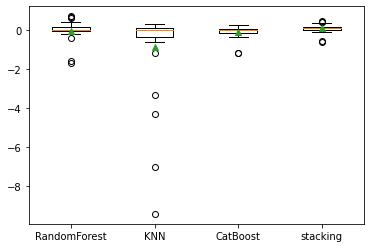

In [69]:
# get the models to evaluate
models = get_models()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
	scores = evaluate_model(model, X, y)
	results.append(scores)
	names.append(name)
	print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()

### Deep Learning

i will be attempting to implement deep Learning neural network and comparing the performance to the current models.


In [71]:
# df.to_csv('df.csv')
# pre_data.to_csv('pre_data.csv')
# predata.to_csv('predata.csv')